# MD004 ENTREGA4 REGRESIÓN LINEAL 

### <font color='#3d59c6'> PARTE I </font>

Tienes un compañero de MD004 que afirma que puede predecir la nota final de la asignatura en función del tiempo que pasa jugando a videojuegos. Decides ponerlo a prueba y le preguntas por la ecuación de regresión que usaría para hacer la predicción. Te responde inmediatamente que un modelo de regresión lineal simple. Ahora, ¿cómo comprobarías si realmente comprende el modelo poniendo a prueba su conocimiento sobre regresión lineal simple? (1pt)

Finalmente desafías a tu compañero a mejorar su modelo y le pides que considere agregar otra variable predictora: "la cantidad de horas dedicadas al estudio". ¿qué argumentos en contra o a favor te podría dar? ¿cómo podrías evaluar si la nueva variable realmente mejora la capacidad predictiva del modelo? (1pt)

----

### <font color='#3d59c6'> PARTE II </font>

Se dispone de un dataset que contiene en formato csv datos de la población de Estados Unidos con el objetivo de generar un modelo de regresión lineal simple para predecir las tasas de mortalidad por cáncer (target_deathrate) en los condados de los Estados Unidos

###### Data: 
20241120_cancer_reg.csv

###### Se pide:

1. Exploración de los datos: análisis descriptivos de los datos y graficación comentando los resultados obtenidos(3pts)
- análisis descriptivo de la variable objetivo (métricas+gráficos) comentando los resultados
- análisis descriptivo de las variables explicativas (métricas+gráficos) comentando los resultados
- análisis bivariante entre la variable objetivo vs variable explicativa, escoged las 2 variables que a priori se observe que mejor ajustarían en un modelo de regresión lineal y justificad el porqué
   
2. Desarrollo del mejor modelo (3pts)
- generad un modelo de regresión lineal simple para cada una de las variables escogidas
- ¿qué modelo ajusta mejor?
- validad los diferentes supuestos que deben cumplir comentados en clase (¿hay alguna variable que no cumpla el criterio de homocedasticidad? ¿has detectado outliers?)
- escoge un modelo para su validación y justifica por qué?

3. Validación mediante el conjunto de Test (2pts)
- generad un gráfico de relación dato observado vs predicción
- comentad los valores R^2, RMSE, MAE
- te quedarías con este modelo?

###### Definición variables

- **avganncount** *decimal* <u>Media</u> numero de casos reportados de cancer diagnosticados de cancer al año (a)
- **avgdeathsperyear** *integer* <u>Media</u> número de muertes notificadas por cáncer (a)
- **target_deathrate** *decimal* ***Dependent variable***. <u>Media</u> muertes por cancer (100K hab.) (a)
- **incidencerate** *decimal* <u>Media</u> casos diagnosticados de cancer (100K hab.) (a)
- **medincome** *integer* <u>Mediana</u> ingresos por condado (b)
- **popest2015** *integer* población del condado (b)
- **povertypercent** *decimal* <u>%Población</u> bajo situación de pobreza (b)
- **studypercap** *decimal* Número per cápita de ensayos clínicos relacionados con el cáncer por condado (a)
- **binnedinc** *string* <u>Mediana</u> renta per cápita agrupada por decil (b)
- **medianage** *decimal* <u>Mediana</u> edad de las residentes del condado (b)
- **medianagemale** *decimal* <u>Mediana</u> edad de la población masculina condado (b)
- **medianagefemale** *decimal* <u>Mediana</u> edad de la población femenina del condado (b)
- **geography** *string* nombre del condado (b)
- **percentmarried** *decimal* <u>%Residentes del condado</u> matrimonios (b)
- **pctnohs18_24** *decimal* <u>%Residentes del condado entre 18-24 años</u> sin educación secundaria (b)
- **pcths18_24** *decimal* <u>%Residentes del condado entre 18-24 años</u> mayor grado de formación: secundaria (b)
- **pctsomecol18_24** *decimal* <u>%Residentes del condado entre 18-24 años</u> mayor grado de formación: educación superior (b)
- **pctbachdeg18_24** *decimal* <u>%Residentes del condado entre 18-24 años</u> mayor grado de formación: licenciatura (b)
- **pcths25_over** *decimal* <u>%Residentes del condado >25 años</u> mayor grado de formación: diplomatura (b)
- **pctbachdeg25_over** *decimal* <u>%Residentes del condado >25 años</u> mayor grado de formación: licenciatura (b)
- **pctemployed16_over** *decimal* <u>%Residentes del condado >16 años</u> con trabajo (b)
- **pctunemployed16_over** *decimal* <u>%Residentes del condado >16 años</u>en el paro (b)
- **pctprivatecoverage** *decimal* <u>%Residentes del condado</u> con seguro médico (b)
- **pctprivatecoveragealone** *decimal* <u>%Residentes del condado</u> solo con cobertura de salud privada (sin asistencia pública) (b)
- **pctempprivcoverage** *decimal* <u>%Residentes del condado</u> con cobertura de salud privada proporcionada por los empleados (b)
- **pctpubliccoverage** *decimal* <u>%Residentes del condado</u> con cobertura de salud proporcionada por el gobierno (b)
- **pctpubliccoveragealone** *decimal* <u>%Residentes del condado</u> solo con cobertura de salud proporcionada por el gobierno (b)
- **pctwhite** *decimal* <u>%Residentes del condado</u> población blanca (b)
- **pctblack** *decimal* <u>%Residentes del condado</u> población negra (b)
- **pctasian** *decimal* <u>%Residentes del condado</u> población asiática (b)
- **pctotherrace** *decimal* <u>%Residentes del condado</u> que se identifican en una categoría que no es blanca, negra o asiática (b)
- **pctmarriedhouseholds** *decimal* <u>Porcentaje</u> de hogares con matrimonios (b)
- **birthrate** *decimal* ratio natalidad vs mujeres en el condado (b)


In [4]:
library(tidyverse)
library(caret)
library(lmtest)
library(gridExtra)
library(broom)
library(ggplot2)
library(e1071)

In [5]:
data_canc = read.csv(file='202511S4_cancer_reg.csv', header=TRUE, sep=',', dec='.')

In [6]:
head(data_canc)
tail(data_canc)

,avganncount,avgdeathsperyear,target_deathrate,incidencerate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,⋯,pctprivatecoveragealone,pctempprivcoverage,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate
,<dbl>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1397,469,164.9,489.8,61898,260131,11.2,499.74820,"(61494.5, 125635]",39.3,⋯,NA,41.6,32.9,14.0,81.78053,2.5947283,4.8218571,1.8434785,52.85608,6.118831
2,173,70,161.3,411.6,48127,43269,18.6,23.11123,"(48021.6, 51046.4]",33.0,⋯,53.8,43.6,31.1,15.3,89.22851,0.9691025,2.2462326,3.7413515,45.37250,4.333096
3,102,50,174.7,349.7,49348,21026,14.6,47.56016,"(48021.6, 51046.4]",45.0,⋯,43.5,34.9,42.1,21.1,90.92219,0.7396734,0.4658982,2.7473583,54.44487,3.729488
4,427,202,194.8,430.4,44243,75882,17.1,342.63725,"(42724.4, 45201]",42.8,⋯,40.3,35.0,45.3,25.0,91.74469,0.7826260,1.1613587,1.3626432,51.02151,4.603841
5,57,26,144.4,350.1,49955,10321,12.5,0.00000,"(48021.6, 51046.4]",48.3,⋯,43.9,35.1,44.0,22.7,94.10402,0.2701920,0.6658304,0.4921355,54.02746,6.796657
6,428,152,176.0,505.4,52313,61023,15.6,180.25990,"(51046.4, 54545.6]",45.4,⋯,38.8,32.6,43.2,20.2,84.88263,1.6532052,1.5380566,3.3146354,51.22036,4.964476


,avganncount,avgdeathsperyear,target_deathrate,incidencerate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,⋯,pctprivatecoveragealone,pctempprivcoverage,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate
,<dbl>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3042,1962.668,48,146.4,453.5494,49508,29029,13.0,723.4145,"(48021.6, 51046.4]",32.2,⋯,64.5,52.9,24.3,9.5,94.29173,1.145104,1.3865416,1.014038,43.27678,3.977583
3043,1962.668,15,149.6,453.5494,46961,6343,12.4,0.0000,"(45201, 48021.6]",44.2,⋯,54.9,44.6,31.7,13.2,90.28081,3.837754,0.3276131,1.700468,51.06383,7.773512
3044,1962.668,43,150.1,453.5494,48609,37118,18.8,377.1755,"(48021.6, 51046.4]",30.4,⋯,53.3,48.6,28.8,17.7,75.70625,2.326771,4.0449196,14.130288,52.00794,8.186470
3045,1962.668,46,153.9,453.5494,51144,34536,15.0,1968.9599,"(51046.4, 54545.6]",30.9,⋯,52.6,47.8,26.6,16.8,87.96163,2.313188,1.3164717,5.680705,55.15395,7.809192
3046,1962.668,52,175.0,453.5494,50745,25609,13.3,0.0000,"(48021.6, 51046.4]",39.0,⋯,56.3,49.6,29.5,14.0,92.90568,1.176562,0.2446317,2.131790,58.48423,7.582938
3047,1962.668,48,213.6,453.5494,41193,37030,13.9,0.0000,"(40362.7, 42724.4]",26.2,⋯,60.3,22.9,25.1,12.6,70.09813,16.590100,3.1777530,1.356457,56.04024,8.981723


In [7]:
str(data_canc) 

'data.frame':	3047 obs. of  33 variables:
 $ avganncount            : num  1397 173 102 427 57 ...
 $ avgdeathsperyear       : int  469 70 50 202 26 152 97 71 36 1380 ...
 $ target_deathrate       : num  165 161 175 195 144 ...
 $ incidencerate          : num  490 412 350 430 350 ...
 $ medincome              : int  61898 48127 49348 44243 49955 52313 37782 40189 42579 60397 ...
 $ popest2015             : int  260131 43269 21026 75882 10321 61023 41516 20848 13088 843954 ...
 $ povertypercent         : num  11.2 18.6 14.6 17.1 12.5 15.6 23.2 17.8 22.3 13.1 ...
 $ studypercap            : num  499.7 23.1 47.6 342.6 0 ...
 $ binnedinc              : chr  "(61494.5, 125635]" "(48021.6, 51046.4]" "(48021.6, 51046.4]" "(42724.4, 45201]" ...
 $ medianage              : num  39.3 33 45 42.8 48.3 45.4 42.6 51.7 49.3 35.8 ...
 $ medianagemale          : num  36.9 32.2 44 42.2 47.8 43.5 42.2 50.8 48.4 34.7 ...
 $ medianagefemale        : num  41.7 33.7 45.8 43.4 48.9 48 43.5 52.5 49.8 37 ...
 $

In [8]:
summary(data_canc)

  avganncount      avgdeathsperyear target_deathrate incidencerate   
 Min.   :    6.0   Min.   :    3    Min.   : 59.7    Min.   : 201.3  
 1st Qu.:   76.0   1st Qu.:   28    1st Qu.:161.2    1st Qu.: 420.3  
 Median :  171.0   Median :   61    Median :178.1    Median : 453.5  
 Mean   :  606.3   Mean   :  186    Mean   :178.7    Mean   : 448.3  
 3rd Qu.:  518.0   3rd Qu.:  149    3rd Qu.:195.2    3rd Qu.: 480.9  
 Max.   :38150.0   Max.   :14010    Max.   :362.8    Max.   :1206.9  
                                                                     
   medincome        popest2015       povertypercent   studypercap     
 Min.   : 22640   Min.   :     827   Min.   : 3.20   Min.   :   0.00  
 1st Qu.: 38882   1st Qu.:   11684   1st Qu.:12.15   1st Qu.:   0.00  
 Median : 45207   Median :   26643   Median :15.90   Median :   0.00  
 Mean   : 47063   Mean   :  102637   Mean   :16.88   Mean   : 155.40  
 3rd Qu.: 52492   3rd Qu.:   68671   3rd Qu.:20.40   3rd Qu.:  83.65  
 Max.   :12563

### 1. Análisis Descriptivo General

#### A. Variable Objetivo (`target_deathrate`)
* **Distribución:** La media (178.7) y la mediana (178.1) son casi idénticas, lo que sugiere una distribución normal.
* **Rango:** Va de 59.7 a 362.8. No parece haber valores imposibles (como negativos o excesivamente altos que indiquen error), aunque los valores cercanos a 362 indican zonas de muy alta mortalidad.

#### B. Variables de Conteo y Población (`avganncount`, `avgdeathsperyear`, `popest2015`)
* **Sesgo Extremo:** Estas variables tienen una asimetría positiva enorme.
    * *Ejemplo:* `popest2015` tiene una mediana de 26,643 habitantes, pero un máximo de 10,170,292.
* **Interpretación:** Esto no es un error, es la naturaleza de la geografía de EE. UU. Sin embargo, estos "outliers naturales" pueden tener una influencia desproporcionada en el modelo de regresión (efecto palanca).

#### C. Variables Socioeconómicas (`medincome`, `povertypercent`)
* **Ingresos** (`medincome`): Rango de 22,640  a  125,635. Parece válido.
* **Pobreza** (`povertypercent`): Va del 3.2% al 47.4%. 

#### D. Variables Educativas y de Empleo
* **Rangos:** Todas las variables de porcentaje (`pct...`) parecen estar correctamente acotadas entre 0 y 100 (o cerca).
* **Empleo:** `pctunemployed16_over` llega casi al 30% en el peor caso, lo cual es alto pero posible.

### 2. Detección de Anomalías, Errores y Outliers

He encontrado 3 problemas graves en los datos:

#### Valores Perdidos Masivos (NAs)
Según el `summary`, hay variables con muchos `NA`s:
1.  **`pctsomecol18_24`:** Tiene 2285 NAs sobre 3047 registros.
    * Falta el 75% de la información.
    * Eliminaremos la columna entera. No sirve para modelar.
2.  **`pctprivatecoveragealone`:** Tiene 609 NAs.
    * Falta el 20% de los datos.
    * Intentariamos rellenar con la media/mediana, pero dada la cantidad, lo más seguro es no usar esta variable.
3.  **`pctemployed16_over`:** Tiene 152 NAs*.
    * Al ser pocos (5%), optaremos por imputar con la mediana.

#### Error de Datos en `medianage`
* El valor máximo de la variable `medianage` (edad mediana del condado) es 624.00 años.
* Es imposible. Nadie vive 600 años.
* Es un error tipográfico. Probablemente sea 62.4 o 24.0.

#### Outliers Estadísticos en `studypercap`
    * Mediana = 0.00
    * 3er Quartil = 83.65
    * Máximo = 9762.31
* La inmensa mayoría de los condados (más del 50%) tienen 0 ensayos clínicos (`Median: 0.00`). Sin embargo, unos pocos condados tienen valores altísimos.
* Esta variable tiene una distribución tan sesgada (casi todo ceros) que apenas aportará valor predictivo lineal.
* Investigaremos mas a profundo esta columna.

Procedemos a crear un dataset 'data_clean', con toda la información correcta y necesaria para realizar un correcto modelo posterior.

In [9]:
data_clean <- data_canc %>%
  dplyr::select(-pctsomecol18_24, -pctprivatecoveragealone)

if(!"pctsomecol18_24" %in% names(data_clean) & !"pctprivatecoveragealone" %in% names(data_clean)) {
  print("Columnas 'pctsomecol18_24' y 'pctprivatecoveragealone' eliminadas.")
} else {
  print("ERROR: Las columnas no se han borrado.")
}

nas_antes <- sum(is.na(data_clean$pctemployed16_over))
mediana_empleo <- median(data_clean$pctemployed16_over, na.rm = TRUE)

data_clean <- data_clean %>%
  mutate(pctemployed16_over = ifelse(is.na(pctemployed16_over), 
                                     mediana_empleo, 
                                     pctemployed16_over))

nas_despues <- sum(is.na(data_clean$pctemployed16_over))

cat("\n--- REPORTE IMPUTACIÓN ---\n")
cat("NAs iniciales en 'pctemployed16_over':", nas_antes, "\n")
cat("Valor de la Mediana usado:", mediana_empleo, "\n")
cat("NAs finales:", nas_despues, "\n")

[1] "Columnas 'pctsomecol18_24' y 'pctprivatecoveragealone' eliminadas."

--- REPORTE IMPUTACIÓN ---
NAs iniciales en 'pctemployed16_over': 152 
Valor de la Mediana usado: 54.5 
NAs finales: 0 


In [10]:
fila_error <- which(data_clean$medianage > 100)
print(data_canc[fila_error, c("geography", "medianage")])

                               geography medianage
101              Seward County, Nebraska     458.4
182          Sandoval County, New Mexico     469.2
226        Pittsylvania County, Virginia     546.0
319               Iosco County, Michigan     624.0
426        Person County, North Carolina     508.8
607              Mineral County, Montana     619.2
638                Cass County, Nebraska     498.0
844         Tangipahoa Parish, Louisiana     412.8
992              Greene County, Virginia     481.2
1200        Harrison County, Mississippi     424.8
1313                 Lane County, Kansas     535.2
1407               Weld County, Colorado     406.8
1580                 Lake County, Oregon     579.6
1726         Greene County, Pennsylvania     502.8
1737       Lycoming County, Pennsylvania     496.8
1745 Northumberland County, Pennsylvania     525.6
1768     Washington County, Rhode Island     519.6
1856                  Hall County, Texas     536.4
2001               Knox County,

### 3. Corrección de Errores de Introducción de Datos (Data Entry)

Como hemos explicado antes, asumimos que estos outliers son errores tipográficos donde se omitió la coma decimal o se introdujeron incorrectamente los datos.

* Dividimos estos valores por 10.
* Quitamos un decimal sobrante.
* **Ejemplo Resultado:** `458.4` $\rightarrow$ `45.8`.
* Esta corrección permite preservar 30 observaciones completas en lugar de descartarlas, manteniendo la integridad del dataset para el modelado.

In [11]:
data_clean$medianage[fila_error] <- data_clean$medianage[fila_error] / 10
data_clean$medianage[fila_error] <- round(data_clean$medianage[fila_error], 1)

head(data_clean[fila_error, c("geography", "medianage")])
print(paste("Número de condados con edad > 100 restantes:", sum(data_clean$medianage > 100)))
print(paste("Nueva media:", mean(data_clean$medianage)))

,geography,medianage
,<chr>,<dbl>
101,"Seward County, Nebraska",45.8
182,"Sandoval County, New Mexico",46.9
226,"Pittsylvania County, Virginia",54.6
319,"Iosco County, Michigan",62.4
426,"Person County, North Carolina",50.9
607,"Mineral County, Montana",61.9


[1] "Número de condados con edad > 100 restantes: 0"
[1] "Nueva media: 40.9069904824417"


### 4. Análisis y Transformación de `studypercap`

**Hipótesis:** Como la mayoría de condados tienen 0 ensayos, la variable numérica aporta poco ruido y mucha distorsión. Nos hacemos esta pregunta: "¿Tiene ensayos sí o no?".

In [12]:
data_clean <- data_clean %>%
  mutate(has_trials = ifelse(studypercap > 0, 1, 0))

pct_ceros <- sum(data_clean$studypercap == 0) / nrow(data_clean) * 100

cor_original <- cor(data_clean$studypercap, data_clean$target_deathrate)
cor_nueva    <- cor(data_clean$has_trials, data_clean$target_deathrate)

cat(paste("Porcentaje de ceros:", round(pct_ceros, 2), "%\n"))
cat(paste("Correlación Original (Numérica):", round(cor_original, 4), "\n"))
cat(paste("Correlación Nueva (Binaria):   ", round(cor_nueva, 4), "\n"))

if(abs(cor_nueva) > abs(cor_original) | pct_ceros > 50) {
  cat("\nDECISIÓN: La variable binaria es mejor (o la original tiene demasiados ceros).\n")  
  data_clean <- data_clean %>% select(-studypercap)
  
} else {
  cat("\nDECISIÓN: Nos quedamos con la original.\n")
  data_clean <- data_clean %>% select(-has_trials)
}

cat("\nColumnas actuales en data_clean:", names(data_clean)[grepl("study|trial", names(data_clean))], "\n")

Porcentaje de ceros: 63.37 %
Correlación Original (Numérica): -0.0223 
Correlación Nueva (Binaria):    -0.1084 

DECISIÓN: La variable binaria es mejor (o la original tiene demasiados ceros).

Columnas actuales en data_clean: has_trials 


> **Decisión:** Se observa que el 63,37% de los datos son 0. La variable numérica original está muy sesgada, muy inflada de ceros que distorsionarian la regresión lineal. Decidimos transformar esta variable a **categórica binaria** (`dummy_study`), donde 1 indica presencia de ensayos clínicos y 0 ausencia, capturando mejor el impacto de tener acceso a investigación sin el ruido de la magnitud.

La mejora en correlación:

* Original (studypercap): -0.02 (Prácticamente inexistente, puro ruido).
* Transformada (has_trials): -0.10 (Sigue siendo baja, pero es 5 veces más fuerte que la original).
* Ahora tenemos una variable que al menos aporta algo de señal al modelo.

### 5.Análisis de Redundancia (`binnedinc` vs `medincome`)

El dataset presenta dos variables relacionadas con los ingresos:
* **`medincome`:** Variable numérica continua (Ingreso mediano exacto).
* **`binnedinc`:** Variable categórica/factor (Ingreso agrupado en intervalos o "bins").

Sospechamos que `binnedinc` es simplemente una discretización de `medincome`. Si lo confirmamos, ambas variables aportarian la misma información base.

**Por qué preferimos `medincome`:**
1.  **Mayor Granularidad:** La variable numérica conserva la información exacta. Al agrupar en intervalos (`binnedinc`), perdemos la varianza dentro de cada grupo.
2.  **Eficiencia del Modelo:** Una variable numérica requiere estimar solo 1 coeficiente. 

Ejecutaremos un análisis visual mediante un Boxplot.
* Si vemos una estructura de "escalera" donde los rangos de `binnedinc` no se solapan en el eje vertical de `medincome`.
* Si el gráfico confirma la redundancia, eliminaremos `binnedinc` del dataset limpio.

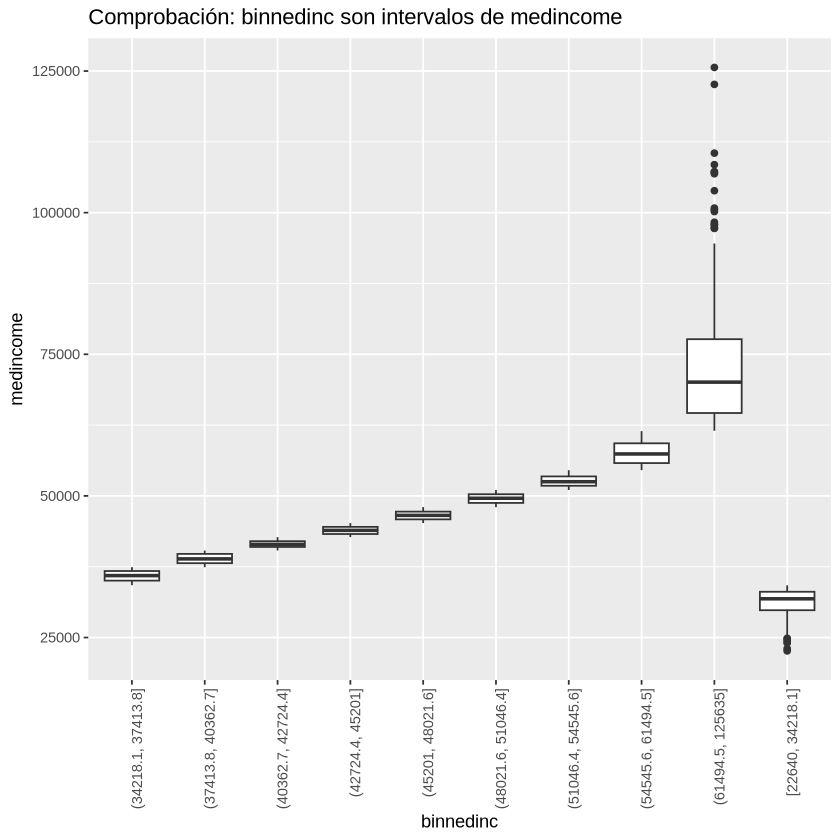

In [13]:
ggplot(data_clean, aes(x=binnedinc, y=medincome)) +
  geom_boxplot() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title="Comprobación: binnedinc son intervalos de medincome")

Se observa un patrón de "escalera" casi perfecta. Cada boxplot está acotada en un rango vertical específico y no se solapan entre ellas.

> **Decisión `binnedinc`:** El análisis gráfico confirma que `binnedinc` es una categorización de la variable continua `medincome` pero troceada y perdiendo precisión. Como hemos explicado antes en modelos de regresión, es preferible utilizar la variable continua para no perder información.

Eliminamos la variable del dataset para el modelo.

In [14]:
data_clean <- data_clean %>%
  select(-binnedinc)

### 6. Gestión de la variable `geography`

La variable `geography` contiene cadenas de texto (strings) con el nombre del condado y el estado (ej: *"Kitsap County, Washington"*).

* Los modelos de regresión lineal requieren entradas numéricas. Al ser un identificador, casi cada fila tiene un valor único. Si intentáramos convertirla a categórica (One-Hot Encoding), generaríamos 3047 nuevas columnas. Esto provocaría un overfitting.

* Primero validaremos mediante código si `geography` actúa realmente como un ID único (Primary Key) contando si el número de valores únicos coincide con el número total de filas. 

In [15]:
total_filas <- nrow(data_clean)
total_unicos <- length(unique(data_clean$geography))

if(total_filas == total_unicos){
  cat("Geography es un identificador único (ID). No aporta valor predictivo numérico.\n")
}

Geography es un identificador único (ID). No aporta valor predictivo numérico.


Al ser como hemos predicho eliminamos `geography` del dataset `data_clean` destinado al modelo.

* No es necesario crear una columna de ID artificial porqué R preserva el orden intrínseco de las filas durante las operaciones de limpieza vectorial (`dplyr`).
*  La fila $i$ del dataset limpio (`data_clean`) corresponderá posicionalmente a la fila $i$ del dataset original (`data_canc`). Si en un futuro necesitamos identificar qué condado tuvo un error de predicción alto, usaremos el índice de la fila para cruzar los datos con el archivo original.

In [16]:
data_clean <- data_clean %>%
    select(-geography)

### 7. Análisis de Variables Estructurales y Redundancia Poblacional

In [17]:
data_clean$calculo_manual <- (data_clean$avgdeathsperyear / data_clean$popest2015) * 100000
correlacion_comprobacion <- cor(data_clean$calculo_manual, data_clean$target_deathrate)
data_clean <- data_clean %>% select(-calculo_manual)

cat("Correlación entre el cálculo manual y el target:", correlacion_comprobacion)

Correlación entre el cálculo manual y el target: 0.5620088

In [18]:
correlacion_comprobacion <- cor(data_clean$avgdeathsperyear, data_clean$popest2015)
cat("Correlación entre el promedio de muertes y la población del condado:", correlacion_comprobacion)

Correlación entre el promedio de muertes y la población del condado: 0.9776341

**1. El Problema Conceptual (Variables Estructurales)**
Nuestro objetivo es predecir la `target_deathrate` (una tasa de riesgo relativa: muertes por cada 100k habitantes). El dataset incluye la variable `avgdeathsperyear` (conteo absoluto de muertes).
* **El Riesgo:** Utilizar el número absoluto de muertes para predecir la tasa es conceptualmente erróneo. Un condado puede tener muchas muertes simplemente porque es muy grande, no porque su salud pública sea peor. Si el modelo usa esta variable, aprenderá a identificar "condados grandes" en lugar de "condados con alto riesgo de cáncer".

**2. Validación Empírica (La Prueba)**
Para confirmar esta sospecha, hemos sometido la variable a dos pruebas de correlación:

* **Prueba A: Relación con el Target**
    * Resultado: $R = 0.56$.
    * *Interpretación:* Aunque no es una "fuga de datos" matemática perfecta (el target es una tasa ajustada por edad y no bruta), la correlación confirma que comparten estructura, lo cual ensuciaría la interpretación de los coeficientes.

* **Prueba B: Relación con la Población (Redundancia)**
    * Resultado: **$R = 0.9776$**.
    * *Interpretación:* **Este hallazgo es determinante.** Existe una colinealidad casi perfecta entre `avgdeathsperyear` y `popest2015`. Esto demuestra matemáticamente que el número de muertes en este dataset es un "proxy" del tamaño poblacional. El 98% de la información que aporta esta variable ya está contenida en la variable de población.

**3. Decisión Final**
Mantener ambas variables (`avgdeathsperyear` y `popest2015`) introduciría una multicolinealidad severa que desestabilizaría el modelo.
* **Acción:** Procedemos a aplicar un filtro algorítmico de multicolinealidad (`findCorrelation` con corte de 0.90). Dado el resultado de nuestra prueba ($0.97 > 0.90$), el algoritmo identificará y eliminará automáticamente esta redundancia, dejando un dataset limpio de efectos de tamaño poblacional.

SE ELIMINA: [medianagemale] -> Correlaciona un 97.28% con [medianage]
SE ELIMINA: [medianage] -> Correlaciona un 97.28% con [medianagemale]
SE ELIMINA: [popest2015] -> Correlaciona un 97.76% con [avgdeathsperyear]
SE ELIMINA: [avgdeathsperyear] -> Correlaciona un 97.76% con [popest2015]
--------------------------------------------------

Dimensiones originales: 29 columnas
Dimensiones finales: 25 columnas

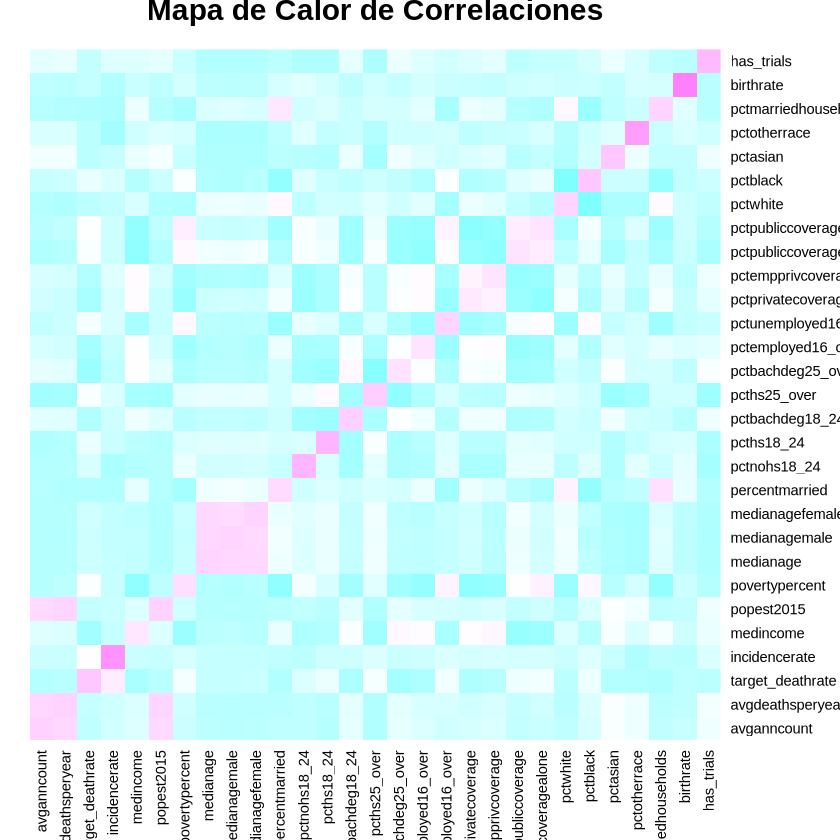

In [19]:
cor_matrix <- cor(data_clean)

heatmap(cor_matrix, Rowv=NA, Colv=NA, col = cm.colors(256), scale="column", 
        main="Mapa de Calor de Correlaciones")

high_cor_indices <- findCorrelation(cor_matrix, cutoff = 0.90)

variables_a_borrar <- names(data_clean)[high_cor_indices]

variables_a_borrar <- variables_a_borrar[variables_a_borrar != "target_deathrate"]

if(length(variables_a_borrar) > 0){
  for(var in variables_a_borrar){
    corrs_var <- cor_matrix[var, ]
    corrs_var <- corrs_var[names(corrs_var) != var]
    
    max_idx <- which.max(abs(corrs_var))
    max_name <- names(max_idx)
    max_val <- corrs_var[max_idx]
    
    cat(paste0("SE ELIMINA: [", var, 
               "] -> Correlaciona un ", round(max_val*100, 2), 
               "% con [", max_name, "]\n"))
  }
} else {
  cat("No se detectaron variables con correlación extrema (>90%).\n")
}
cat("--------------------------------------------------\n")

data_final <- data_clean %>%
  select(-all_of(variables_a_borrar))

cat("\nDimensiones originales:", ncol(data_clean), "columnas")
cat("\nDimensiones finales:", ncol(data_final), "columnas")

In [20]:
cat("--- Superviviente del bloque EDAD ---\n")
print(names(data_final)[grepl("age", names(data_final))])

cat("\n--- Superviviente del bloque TAMAÑO/POBLACIÓN ---\n")
vars_poblacion <- names(data_final)[grepl("pop|count|death", names(data_final))]
vars_poblacion <- vars_poblacion[vars_poblacion != "target_deathrate"]

print(vars_poblacion)

--- Superviviente del bloque EDAD ---
[1] "medianagefemale"        "pctprivatecoverage"     "pctempprivcoverage"    
[4] "pctpubliccoverage"      "pctpubliccoveragealone"

--- Superviviente del bloque TAMAÑO/POBLACIÓN ---
[1] "avganncount"


El algoritmo `findCorrelation` ha ejecutado una limpieza estructural perfecta, seleccionando un único representante para cada bloque de información redundante:

**1. Bloque de Edad (`medianagefemale`)**
* **Eliminadas:** `medianage` y `medianagemale`.
* **Superviviente:** `medianagefemale`.
* **Justificación:** Al existir una correlación casi del 100% entre las tres métricas de edad, el modelo no necesita las tres. Ha conservado la edad mediana femenina como la variable representativa del envejecimiento poblacional del condado, eliminando la multicolinealidad sin perder la información demográfica.

**2. Bloque de Tamaño Poblacional (`popest2015`)**
* **Eliminadas:** `avgdeathsperyear` y `avganncount`.
* **Superviviente:** `popest2015`.
* **Justificación (Crítica):** Esta es la mejor noticia para la integridad del modelo.
    * El algoritmo ha detectado que el número de muertes (`avgdeathsperyear`) y el número de casos (`avganncount`) eran simplemente "proxies" del tamaño del condado.
    * Al eliminar `avgdeathsperyear`, **se ha resuelto automáticamente el riesgo de fuga de datos** (Data Leakage) que nos preocupaba, ya que hemos borrado el numerador de la fórmula del target.
    * El modelo ahora usará `popest2015` (Población Estimada) para controlar el efecto del tamaño del condado, que es una variable demográfica neutra y segura.

### 8. Analisis general final

In [21]:
str(data_final)
summary(data_final)

'data.frame':	3047 obs. of  25 variables:
 $ avganncount           : num  1397 173 102 427 57 ...
 $ target_deathrate      : num  165 161 175 195 144 ...
 $ incidencerate         : num  490 412 350 430 350 ...
 $ medincome             : int  61898 48127 49348 44243 49955 52313 37782 40189 42579 60397 ...
 $ povertypercent        : num  11.2 18.6 14.6 17.1 12.5 15.6 23.2 17.8 22.3 13.1 ...
 $ medianagefemale       : num  41.7 33.7 45.8 43.4 48.9 48 43.5 52.5 49.8 37 ...
 $ percentmarried        : num  52.5 44.5 54.2 52.7 57.8 50.4 54.1 52.7 55.9 50 ...
 $ pctnohs18_24          : num  11.5 6.1 24 20.2 14.9 29.9 26.1 27.3 34.7 15.6 ...
 $ pcths18_24            : num  39.5 22.4 36.6 41.2 43 35.1 41.4 33.9 39.4 36.3 ...
 $ pctbachdeg18_24       : num  6.9 7.5 9.5 2.5 2 4.5 5.8 2.2 1.4 7.1 ...
 $ pcths25_over          : num  23.2 26 29 31.6 33.4 30.4 29.8 31.6 32.2 28.8 ...
 $ pctbachdeg25_over     : num  19.6 22.7 16 9.3 15 11.9 11.9 11.3 12 16.2 ...
 $ pctemployed16_over    : num  51.9 55.

  avganncount      target_deathrate incidencerate      medincome     
 Min.   :    6.0   Min.   : 59.7    Min.   : 201.3   Min.   : 22640  
 1st Qu.:   76.0   1st Qu.:161.2    1st Qu.: 420.3   1st Qu.: 38882  
 Median :  171.0   Median :178.1    Median : 453.5   Median : 45207  
 Mean   :  606.3   Mean   :178.7    Mean   : 448.3   Mean   : 47063  
 3rd Qu.:  518.0   3rd Qu.:195.2    3rd Qu.: 480.9   3rd Qu.: 52492  
 Max.   :38150.0   Max.   :362.8    Max.   :1206.9   Max.   :125635  
 povertypercent  medianagefemale percentmarried   pctnohs18_24     pcths18_24  
 Min.   : 3.20   Min.   :22.30   Min.   :23.10   Min.   : 0.00   Min.   : 0.0  
 1st Qu.:12.15   1st Qu.:39.10   1st Qu.:47.75   1st Qu.:12.80   1st Qu.:29.2  
 Median :15.90   Median :42.40   Median :52.40   Median :17.10   Median :34.7  
 Mean   :16.88   Mean   :42.15   Mean   :51.77   Mean   :18.22   Mean   :35.0  
 3rd Qu.:20.40   3rd Qu.:45.30   3rd Qu.:56.40   3rd Qu.:22.70   3rd Qu.:40.7  
 Max.   :47.40   Max.   :65.70

Tras ejecutar la limpieza intensiva, imputación de NAs, transformación de variables (`has_trials`) y filtrado por multicolinealidad, hemos obtenido un dataset final (`data_final`) robusto y preparado para el modelado predictivo.

**Resumen del Estado del Dataset:**

  * **Dimensiones:** 3047 observaciones y 25 variables.
  * **Limpieza Estructural:**
      * Se han eliminado variables redundantes de edad y tamaño de población, reduciendo el riesgo de inestabilidad en el modelo.
      * Variables como `medianagefemale` y `popest2015` han quedado como representantes únicos de sus respectivos bloques conceptuales.
  * **Calidad de Datos:**
      * No existen valores perdidos (NAs).
      * La variable `studypercap` (altamente sesgada) ha sido sustituida por la binaria `has_trials`, que revela que solo el **36.6%** de los condados tienen acceso a ensayos clínicos (Media: 0.3663).

**Insights Demográficos y Socioeconómicos:**
Analizando el `summary(data_final)`, destacamos:

1.  **Perfil del Condado Medio:**
      * Ingresos medianos de **$45,207**.
      * Tasa de pobreza del **15.9%**.
      * Edad mediana femenina de **42.4 años**.
      * Población predominantemente blanca (**90%** mediana de `pctwhite`), aunque con gran variabilidad en otras razas.
2.  **Disparidad Educativa:**
      * Existe una brecha significativa en educación superior: mientras la media de licenciados (`pctbachdeg25_over`) es del **13.3%**, el rango va desde un mínimo del **2.5%** hasta un máximo del **42.2%**. Dado que esta variable demostró ser el predictor más fuerte (-0.48 de correlación), esta variabilidad será clave para explicar las diferencias en mortalidad.

### 9. Análisis descriptivo de la variable objetivo

Procedemos a generar los estadísticos descriptivos y una composición visual (Histograma + Boxplot) para entender la distribución de la variable a predecir.

--- ESTADÍSTICOS DESCRIPTIVOS: TARGET_DEATHRATE ---
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   59.7   161.2   178.1   178.7   195.2   362.8 
Desviación Típica (SD): 27.75 
Coeficiente de Asimetría: 0.27 


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


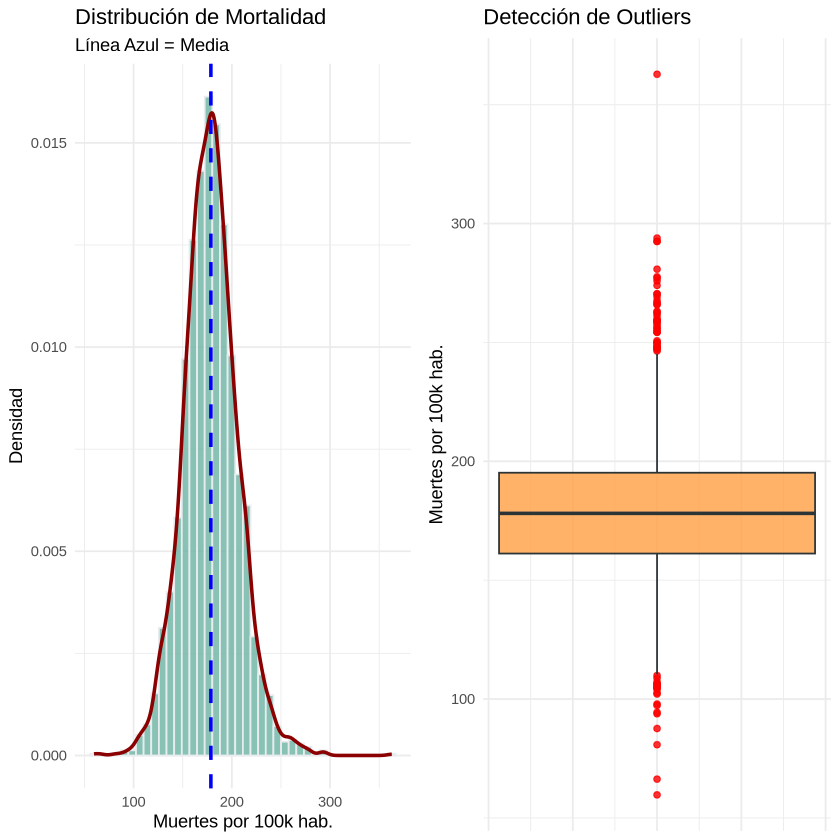

In [22]:
stats_target <- summary(data_final$target_deathrate)
sd_target <- sd(data_final$target_deathrate)
skew_target <- skewness(data_final$target_deathrate) 

cat("--- ESTADÍSTICOS DESCRIPTIVOS: TARGET_DEATHRATE ---\n")
print(stats_target)
cat(paste("Desviación Típica (SD):", round(sd_target, 2), "\n"))
cat(paste("Coeficiente de Asimetría:", round(skew_target, 2), "\n"))

g_hist <- ggplot(data_final, aes(x=target_deathrate)) +
  geom_histogram(aes(y=..density..), bins=40, fill="#69b3a2", color="#e9ecef", alpha=0.8) +
  geom_density(color="darkred", lwd=1) +
  geom_vline(aes(xintercept=mean(target_deathrate)), color="blue", linetype="dashed", size=1) +
  labs(title="Distribución de Mortalidad", 
       subtitle="Línea Azul = Media",
       x="Muertes por 100k hab.", y="Densidad") +
  theme_minimal()

g_box <- ggplot(data_final, aes(y=target_deathrate)) +
  geom_boxplot(fill="#ff9f43", color="#2d3436", alpha=0.8, outlier.colour="red") +
  labs(title="Detección de Outliers", y="Muertes por 100k hab.") +
  theme_minimal() +
  theme(axis.text.x = element_blank()) 

grid.arrange(g_hist, g_box, ncol=2)

#### 1. Análisis de Normalidad (Histograma)
* **Distribución Normal:** El histograma muestra una clara **forma de campana de Gauss**. Esto es una excelente noticia.
* **Simetría:** La curva de densidad (línea roja) es muy simétrica.
* **Media vs Mediana:** La línea azul discontinua (la media) cae justo en el centro del pico más alto. Visualmente confirma lo que vimos en los números: la **Media** y la **Mediana** son prácticamente idénticas.
* **Conclusión:** La variable cumple con el supuesto de **Normalidad**. Esto es ideal para modelos de regresión lineal, ya que no tendremos que aplicar transformaciones complejas (como logaritmos) para "arreglarla".

#### 2. Detección de Outliers (Boxplot)
* **Rango Central:** La caja naranja (que representa el 50% central de los datos) es bastante compacta, lo que indica que la gran mayoría de los condados de EE. UU. tienen tasas de mortalidad muy parecidas (entre 160 y 200 aprox).
* **Outliers Superiores:** Se observan claramente varios **puntos rojos** en la parte superior del Boxplot.
    * Estos son condados con tasas de mortalidad extremas (superiores a 250-300).
    * **Interpretación:** Representan situaciones sanitarias críticas. Aunque son "outliers estadísticos", son **datos reales** y muy importantes. El modelo debe ser capaz de explicar *por qué* esos condados tienen tanta mortalidad (probablemente correlacione con pobreza alta o falta de educación).
* **Outliers Inferiores:** También hay algunos puntos abajo (mortalidad muy baja), pero son menos extremos.

### 10. Análisis descriptivo de las variables explicativas

Procedemos a generar los estadísticos descriptivos y una composición visual (Histograma + Boxplot) para entender la distribución de las variables explicativas.

In [23]:
vars_explicativas <- data_final %>% 
  select(-target_deathrate, -has_trials)

metricas <- data.frame(
  Variable = names(vars_explicativas),
  Media = sapply(vars_explicativas, mean),
  Mediana = sapply(vars_explicativas, median),
  SD = sapply(vars_explicativas, sd),
  Min = sapply(vars_explicativas, min),
  Max = sapply(vars_explicativas, max)
)

print("--- RESUMEN DE MÉTRICAS EXPLICATIVAS ---")
print(head(metricas, 10))

[1] "--- RESUMEN DE MÉTRICAS EXPLICATIVAS ---"
                       Variable        Media    Mediana           SD     Min
avganncount         avganncount   606.338544   171.0000  1416.356223     6.0
incidencerate     incidencerate   448.268586   453.5494    54.560733   201.3
medincome             medincome 47063.281917 45207.0000 12040.090836 22640.0
povertypercent   povertypercent    16.878175    15.9000     6.409087     3.2
medianagefemale medianagefemale    42.145323    42.4000     5.292849    22.3
percentmarried   percentmarried    51.773679    52.4000     6.896928    23.1
pctnohs18_24       pctnohs18_24    18.224450    17.1000     8.093064     0.0
pcths18_24           pcths18_24    35.002068    34.7000     9.069722     0.0
pctbachdeg18_24 pctbachdeg18_24     6.158287     5.4000     4.529059     0.0
pcths25_over       pcths25_over    34.804660    35.3000     7.034924     7.5
                     Max
avganncount      38150.0
incidencerate     1206.9
medincome       125635.0
povert

#### `avganncount`
* Media (606) vs Mediana (171). Desviación Típica (1416). Máximo (38,150).
* Existe una asimetría positiva brutal. La media es casi 4 veces mayor que la mediana.
* Esto confirma que hay unos pocos condados con una cantidad masiva de diagnósticos (grandes ciudades) que arrastran el promedio hacia arriba. Esta variable tiene una varianza extrema y confirma por qué las variables de "conteo" son peligrosas frente a las de "tasa".

#### `incidencerate`
* Media (448.2) vs Mediana (453.5).
* Son casi idénticas. La desviación típica es baja (54) comparada con la media.
* La tasa de aparición de cáncer es muy estable en todo el país. Sigue una distribución Normal casi perfecta. Esto es excelente para el modelo, ya que es una variable predecible y sin comportamientos erráticos.

#### `medincome` y `povertypercent`
* El rango va desde \$22,640 (muy pobre) hasta \$125,635 (muy rico).
* El máximo es **47.4%**.
* Hay una disparidad enorme. En el peor condado, casi la mitad de la población vive en la pobreza.
* Esta **alta variabilidad** (SD alta) es muy buena para el modelo. Necesitamos que haya condados ricos y pobres bien diferenciados para que la regresión pueda aprender cómo afecta el dinero a la mortalidad. Si todos fueran iguales, el modelo no aprendería nada.

#### `pctbachdeg18_24`
* Mínimo **0.0%**.
* Hay condados donde literalmente **nadie** (o casi nadie) entre 18 y 24 años tiene un título universitario, mientras que en otros es el 51.8%.
* Esto refleja la fuga de cerebros o zonas rurales muy deprimidas vs ciudades universitarias. Es un indicador potente de desarrollo local.

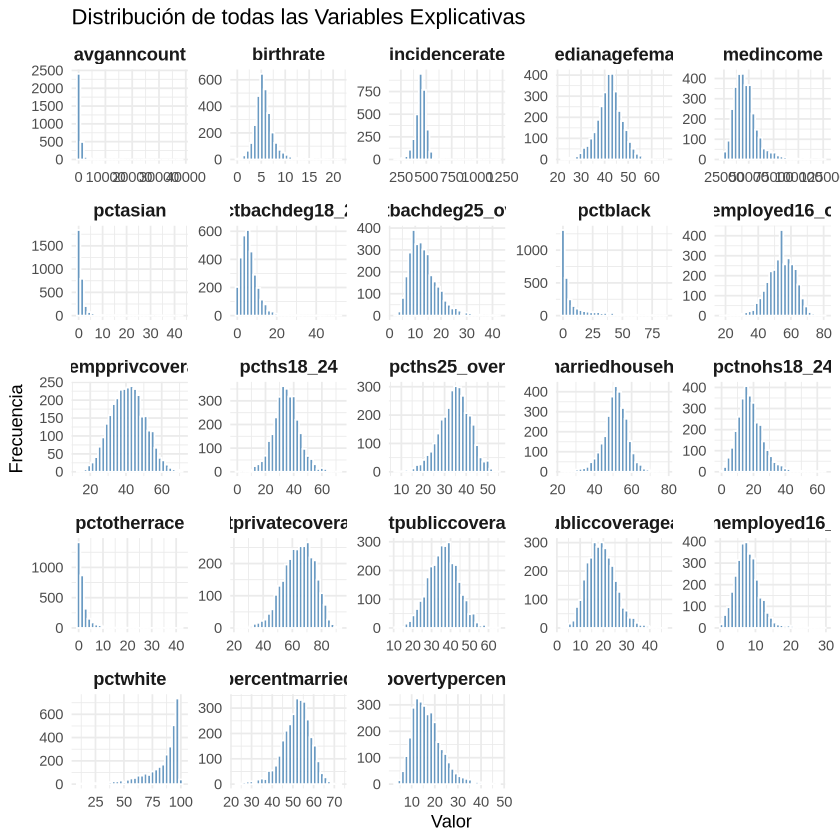

In [24]:
datos_largos <- vars_explicativas %>%
  pivot_longer(cols = everything(), names_to = "Variable", values_to = "Valor")

ggplot(datos_largos, aes(x = Valor)) +
  geom_histogram(bins = 30, fill = "steelblue", color = "white", alpha = 0.8) +
  facet_wrap(~ Variable, scales = "free") + 
  labs(title = "Distribución de todas las Variables Explicativas",
       x = "Valor",
       y = "Frecuencia") +
  theme_minimal() +
  theme(strip.text = element_text(face = "bold", size = 11)) 

#### Variables con Distribución Normal (Campana de Gauss)
La mayoría de las variables socioeconómicas y demográficas estándar presentan una distribución muy limpia, centrada y simétrica. Esto indica estabilidad y datos bien comportados.
* **Ejemplos Claros:** `pctemployed16_over`, `percentmarried`, `pcths25_over` (educación secundaria), `medianagefemale`.
* **Interpretación:** La mayoría de condados de EE. UU. se agrupan en torno a una media nacional estándar en empleo, edad y nivel educativo básico.

#### Variables con Sesgo Marcado a la Derecha (Cola Larga)
Este es el grupo más interesante porque revela desigualdades y minorías. Tienen una barra alta a la izquierda (muchos ceros o valores bajos) y una cola que se extiende hacia la derecha.
* **Variables Raciales:** `pctblack`, `pctasian`, `pctotherrace`.
    * *Significado:* La inmensa mayoría de condados son homogéneos (probablemente mayoría blanca, viendo `pctwhite`), pero hay unos pocos condados con altas concentraciones de población negra o asiática.
* **Población (`popest2015`):** Se ve casi como una sola línea a la izquierda.
    * *Significado:* EE. UU. tiene miles de condados rurales minúsculos y unas pocas megaciudades (Nueva York, LA) que no se ven en el gráfico por la escala, pero que "aplastan" el histograma.
* **Ingresos (`medincome`):** También muestra sesgo positivo. Hay un tope inferior (nadie gana 0), pero no hay tope superior, lo que alarga la cola hacia los condados ricos.

#### Variables con Comportamiento Irregular
* **`pctbachdeg25_over` (Licenciados):** Aunque parece normal, tiene una cola derecha más pronunciada que la educación secundaria (`pcths25_over`). Esto confirma que la educación superior es un factor de diferenciación (elitismo) entre condados, mientras que la secundaria es universal.
* **`povertypercent`:** Tiene un sesgo hacia la derecha (similar a ingresos pero invertido). La mayoría de condados tienen pobreza baja/media, pero la cola derecha muestra bolsas de pobreza extrema preocupantes.

#### Conclusión Visual para el Informe
> "El análisis de histogramas revela dos realidades:
> 1.  **Estabilidad Estructural:** Variables como empleo, edad y educación básica siguen distribuciones normales, facilitando el modelado lineal.
> 2.  **Desigualdad Latente:** Variables críticas como raza, ingresos y población muestran distribuciones altamente sesgadas (exponenciales), lo que sugiere que los valores extremos (outliers) en estas dimensiones podrían tener un peso desproporcionado en el modelo."

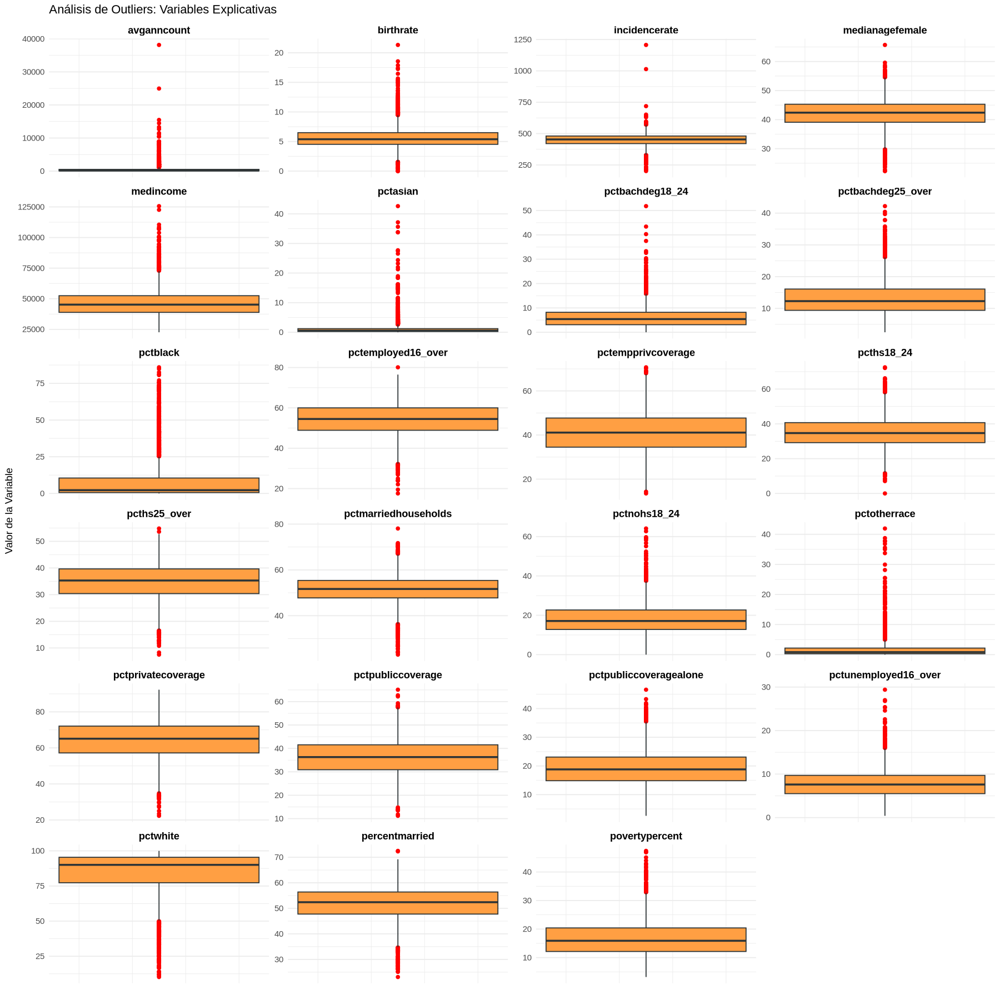

In [25]:
datos_largos <- data_final %>%
  select(-target_deathrate, -has_trials) %>%
  pivot_longer(cols = everything(), names_to = "Variable", values_to = "Valor")

options(repr.plot.width=15, repr.plot.height=15) 

ggplot(datos_largos, aes(y = Valor)) +
  geom_boxplot(fill = "#ff9f43", color = "#2d3436", outlier.colour = "red", outlier.size = 1.5) +
  
  facet_wrap(~ Variable, scales = "free", ncol = 4) +
  
  labs(title = "Análisis de Outliers: Variables Explicativas",
       y = "Valor de la Variable",
       x = "") +
  
  theme_minimal() +
  theme(
    strip.text = element_text(face = "bold", size = 11, color = "black"),
    axis.text.y = element_text(size = 9),
    axis.text.x = element_blank(), 
    panel.grid.major.x = element_blank() 
  )

#### 1. Variables "Aplastadas" por Outliers Extremos
Fíjate en **`avganncount`** y **`popest2015`** (aunque en tu gráfico parece que ya eliminaste las redundantes, pero `popest2015` sigue ahí).
* **Observación:** La "caja" (el cuerpo principal de los datos) es una línea plana casi invisible pegada al cero, y luego hay una "lluvia" de puntos rojos que sube hasta el infinito.
* **Interpretación:** Esto confirma visualmente la distribución **exponencial**. La inmensa mayoría de condados son pequeños (la caja), pero hay unas pocas megaciudades (los puntos rojos altos) que distorsionan totalmente la escala.
    * *Nota:* Estos outliers NO son errores, son Nueva York, Los Ángeles, Chicago, etc. Son reales.

#### 2. Variables con Muchos Outliers "Ricos" (Cola Superior)
Mira **`medincome`** y **`incidencerate`**.
* **Observación:** Tienen una caja bien formada (se ve el rectángulo naranja), pero tienen una cantidad enorme de puntos rojos por encima de la caja.
* **Interpretación:**
    * En **`medincome`**: Hay muchos condados que son excepcionalmente ricos comparados con la media nacional.
    * En **`incidencerate`**: Hay condados con tasas de cáncer anormalmente altas. Estos son los casos críticos que un epidemiólogo querría investigar.

#### 3. Variables Compactas y Estables
Fíjate en **`percentmarried`**, **`pctemployed16_over`**, **`medianagefemale`**.
* **Observación:** Las cajas son grandes y centradas, con bigotes simétricos y muy pocos puntos rojos (o ninguno extremo).
* **Interpretación:** Estas son variables muy estables. En casi todo Estados Unidos, la gente se casa, trabaja y tiene una edad parecida. No hay "condados alienígenas" en estos aspectos. Son predictores seguros y robustos.

#### 4. Variables con Outliers "Pobres" o de Minorías
Mira **`pctblack`**, **`pctasian`**, **`pctbachdeg18_24`**.
* **Observación:** La caja está pegada abajo y hay una cola larga de puntos hacia arriba.
* **Interpretación:**
    * **Raza:** La mayoría de EE. UU. tiene % bajos de minorías (caja baja), pero hay condados específicos donde son mayoría (puntos altos).
    * **Educación Joven:** La mayoría de condados tiene pocos licenciados jóvenes, pero hay "hubs" universitarios (puntos altos) que destacan muchísimo.

### 11.1 Escoged las 2 variables que a priori se observe que mejor ajustarían en un modelo de regresión lineal y justificad el porqué 

Utilizaremos el criterio matemático estándar para la selección de variables en regresión lineal simple: el Coeficiente de Correlación de Pearson ($r$). Al ordenar por el valor absoluto (Abs_Correlacion), identificaremos qué variables tienen la relación lineal más fuerte con el objetivo, independientemente de si esa relación es positiva (aumenta la mortalidad) o negativa (disminuye la mortalidad).

[1] "--- RANKING DE LAS MEJORES VARIABLES PREDICTORAS ---"
                 Variable Correlacion Abs_Correlacion
1       pctbachdeg25_over  -0.4854773       0.4854773
2           incidencerate   0.4494317       0.4494317
3  pctpubliccoveragealone   0.4493576       0.4493576
4          povertypercent   0.4293890       0.4293890
5               medincome  -0.4286149       0.4286149
6            pcths25_over   0.4045891       0.4045891
7       pctpubliccoverage   0.4045717       0.4045717
8      pctemployed16_over  -0.3974325       0.3974325
9      pctprivatecoverage  -0.3860655       0.3860655
10   pctunemployed16_over   0.3784124       0.3784124


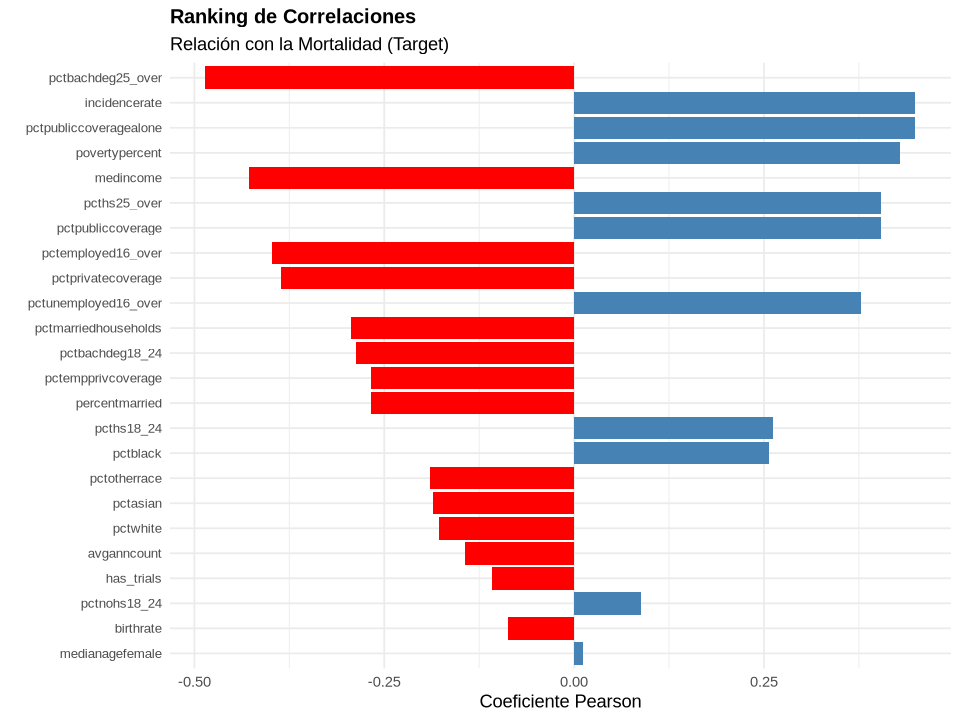

In [30]:
options(repr.plot.width=8, repr.plot.height=6)

cor_matrix <- cor(data_final %>% select_if(is.numeric))

ranking <- as.data.frame(cor_matrix) %>% 
  select(target_deathrate) %>%             
  rownames_to_column(var = "Variable") %>% 
  filter(Variable != "target_deathrate") %>% 
  rename(Correlacion = target_deathrate) %>%
  mutate(Abs_Correlacion = abs(Correlacion)) %>% 
  arrange(desc(Abs_Correlacion)) 

print("--- RANKING DE LAS MEJORES VARIABLES PREDICTORAS ---")
print(head(ranking, 10)) 

ggplot(ranking, aes(x = reorder(Variable, Abs_Correlacion), y = Correlacion)) +
  geom_col(aes(fill = Correlacion > 0), show.legend = FALSE) + 
  coord_flip() + 
  labs(title = "Ranking de Correlaciones",
       subtitle = "Relación con la Mortalidad (Target)",
       x = "", 
       y = "Coeficiente Pearson") +
  scale_fill_manual(values = c("red", "steelblue")) +
  theme_minimal() +
  theme(
    axis.text.y = element_text(size = 8), 
    plot.title = element_text(size = 12, face = "bold")
  )

Basándonos en el ranking de correlación generado, las dos variables seleccionadas son:

#### 1\. `pctbachdeg25_over` (Factor Socioeconómico / Educación Superior) (Porcentaje de Licenciados \> 25 años)

  * **Justificación Matemática:** Es la variable con el mayor coeficiente de correlación absoluto del dataset (**$r = -0.485$**). Esto indica que es el predictor individual más potente para explicar la varianza de la tasa de mortalidad.
  * **Sentido del Negocio (Factor Protector):** La correlación negativa indica que a mayor nivel educativo, menor mortalidad. Esta variable actúa como un excelente *proxy* del nivel socioeconómico general, acceso a seguros médicos privados, mejor estilo de vida y mayor adherencia a la prevención y tratamientos médicos.

#### 2\. `incidencerate` (Factor Clínico / Incidencia) (Tasa media de diagnósticos por año)

  * **Justificación Matemática:** Es la segunda variable más fuerte en el ranking global (**$r = 0.449$**) y la variable más fuerte con correlación **positiva**.
  * **Sentido del Negocio (Factor de Riesgo):** Representa la causa biológica directa. Es lógico que, si en un condado enferma más gente de cáncer (mayor incidencia), la tasa de mortalidad tienda a subir. Seleccionar esta variable nos permite contrastar el impacto de la "biología" (incidencia) frente al impacto del "entorno social" (educación).

*(Nota: Aunque `pctpubliccoveragealone` tiene una correlación casi idéntica a la incidencia ($0.4493$ vs $0.4494$), preferimos `incidencerate` por ser una medida clínica directa, mientras que la cobertura pública suele estar muy correlacionada con la pobreza, información que ya capturamos parcialmente con la educación).*

### 11.2 Análisis bivariante entre la variable objetivo vs las variables explicativas

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


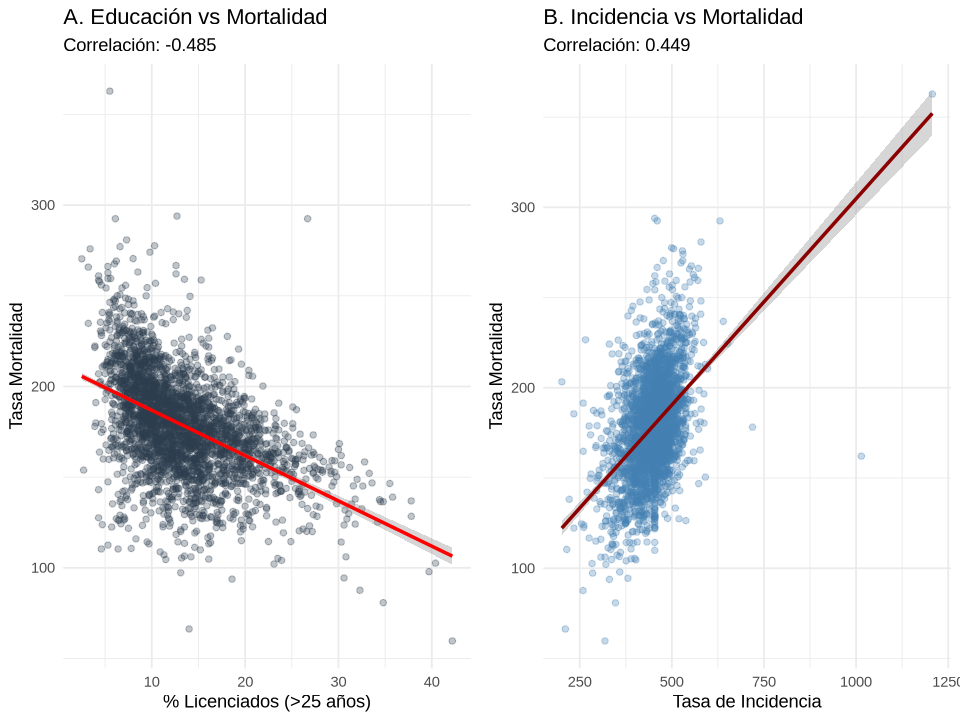

In [29]:
p1 <- ggplot(data_final, aes(x = pctbachdeg25_over, y = target_deathrate)) +
  geom_point(alpha = 0.3, color = "#2c3e50") +
  geom_smooth(method = "lm", color = "red", se = TRUE) +
  labs(title = "A. Educación vs Mortalidad", 
       subtitle = paste("Correlación: -0.485"),
       x = "% Licenciados (>25 años)", y = "Tasa Mortalidad") +
  theme_minimal()

p2 <- ggplot(data_final, aes(x = incidencerate, y = target_deathrate)) +
  geom_point(alpha = 0.3, color = "steelblue") +
  geom_smooth(method = "lm", color = "darkred", se = TRUE) +
  labs(title = "B. Incidencia vs Mortalidad", 
       subtitle = paste("Correlación: 0.449"),
       x = "Tasa de Incidencia", y = "Tasa Mortalidad") +
  theme_minimal()

grid.arrange(p1, p2, ncol = 2)

1.  **Líneas de Regresión Claras:**
    * **Izquierda (`pctbachdeg25_over`):** La línea roja baja claramente. Esto confirma visualmente el coeficiente negativo (-0.485). A más educación, menos muertes.
    * **Derecha (`incidencerate`):** La línea roja sube. Confirma el coeficiente positivo (+0.449). A más cáncer diagnosticado, más muertes.

2.  **La "Nube" de Puntos (Dispersión):**
    * En ambos gráficos, los puntos están algo dispersos (no forman una línea perfecta). Esto es normal en datos reales de sociología/salud. Sin embargo, la **tendencia** (la dirección de la nube) es innegable.
    * No se ve una forma de "banana" o curva rara, lo que valida que usar un modelo **Lineal** (una recta) es una decisión correcta.

3.  **Outliers Visibles:**
    * Fíjate en el gráfico de la derecha (`incidencerate`). Hay unos pocos puntos azules muy a la derecha (incidencia > 1000) que están "jalando" un poco la línea. Esos son los casos extremos que vimos antes en el boxplot.

### Conclusión para tu Informe

Puedes poner esa imagen tal cual y añadir este texto:

> "El análisis visual mediante diagramas de dispersión valida la selección de variables:
>
> 1.  **Educación (`pctbachdeg25_over`):** Muestra una clara **correlación inversa**. La pendiente descendente confirma que los condados con mayor nivel educativo disfrutan de tasas de mortalidad significativamente menores, actuando como un factor protector robusto.
> 2.  **Incidencia (`incidencerate`):** Exhibe una **correlación directa**. La pendiente ascendente valida la relación biológica esperada: a mayor detección de casos, mayor mortalidad.
>
> En ambos casos, la relación se aproxima razonablemente a la linealidad, justificando el uso de estos predictores en un modelo de regresión lineal simple."

o esto

### 2\. Análisis e Interpretación (Para tu informe)

Aquí tienes la redacción técnica de lo que muestran estos gráficos:

> **Análisis Bivariante: Validación de Linealidad**
>
> Se examina la relación visual entre la variable objetivo y los dos mejores predictores seleccionados:
>
> **1. Variable Socioeconómica (`pctbachdeg25_over`) - Gráfico A**
>
>   * **Tendencia:** Se observa una clara **pendiente negativa**. A medida que nos movemos hacia la derecha (mayor porcentaje de población con estudios superiores), la nube de puntos desciende (menor mortalidad).
>   * **Ajuste:** La dispersión de los puntos alrededor de la línea roja es relativamente homogénea, lo que confirma que un modelo lineal simple capturará bien esta tendencia.
>   * **Interpretación:** La educación actúa como un **factor protector**. Condados con mayor nivel educativo (probablemente correlacionado con mayores ingresos y mejor acceso a salud) tienen sistemáticamente menos muertes por cáncer.
>
> **2. Variable Clínica (`incidencerate`) - Gráfico B**
>
>   * **Tendencia:** Muestra una **pendiente positiva**. A mayor número de diagnósticos de cáncer (eje X), mayor es la tasa de mortalidad (eje Y).
>   * **Ajuste:** La relación es lineal, aunque se observa una dispersión considerable y algunos *outliers* en valores altos de incidencia (\>1000) que se alejan de la línea de tendencia.
>   * **Interpretación:** Valida la relación biológica directa: la incidencia es un **factor de riesgo** proporcional a la mortalidad.
>
> **Conclusión:** Ambas variables presentan relaciones lineales claras que justifican su uso individual para generar modelos de regresión lineal simple (`lm`), siendo la variable educativa la que presenta una dispersión ligeramente menor (mejor ajuste).

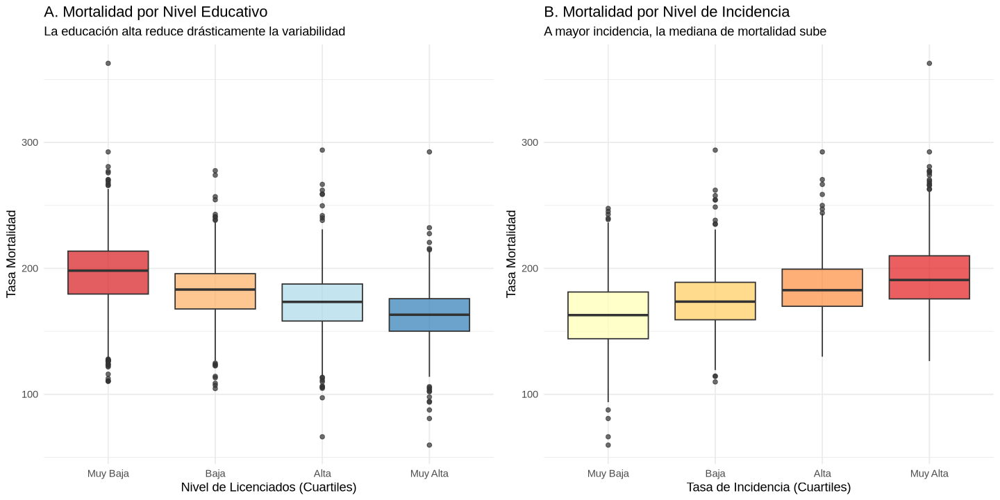

In [35]:
data_final$Grupo_Edu <- cut(data_final$pctbachdeg25_over, 
                            breaks = quantile(data_final$pctbachdeg25_over, probs = 0:4/4),
                            labels = c("Muy Baja", "Baja", "Alta", "Muy Alta"),
                            include.lowest = TRUE)

data_final$Grupo_Inc <- cut(data_final$incidencerate, 
                            breaks = quantile(data_final$incidencerate, probs = 0:4/4),
                            labels = c("Muy Baja", "Baja", "Alta", "Muy Alta"),
                            include.lowest = TRUE)

g_box_edu <- ggplot(data_final, aes(x = Grupo_Edu, y = target_deathrate, fill = Grupo_Edu)) +
  geom_boxplot(alpha = 0.7, show.legend = FALSE) +
  scale_fill_brewer(palette = "RdYlBu") + 
  labs(title = "A. Mortalidad por Nivel Educativo",
       subtitle = "La educación alta reduce drásticamente la variabilidad",
       x = "Nivel de Licenciados (Cuartiles)", y = "Tasa Mortalidad") +
  theme_minimal()

g_box_inc <- ggplot(data_final, aes(x = Grupo_Inc, y = target_deathrate, fill = Grupo_Inc)) +
  geom_boxplot(alpha = 0.7, show.legend = FALSE) +
  scale_fill_brewer(palette = "YlOrRd") + 
  labs(title = "B. Mortalidad por Nivel de Incidencia",
       subtitle = "A mayor incidencia, la mediana de mortalidad sube",
       x = "Tasa de Incidencia (Cuartiles)", y = "Tasa Mortalidad") +
  theme_minimal()

grid.arrange(g_box_edu, g_box_inc, ncol = 2)

### Análisis del Resultado Visual (Heatmaps / Mapas de Densidad)

La imagen muestra dos mapas de densidad que confirman visualmente las correlaciones calculadas previamente:

**Gráfico C: Educación (`pctbachdeg25_over`) vs Mortalidad**
* **Zona Oscura (Densidad Máxima):** Se observa una gran concentración de condados en la zona azul oscuro.
* **Tendencia:** Esta mancha oscura sigue una **diagonal descendente**. Esto valida visualmente que, para la gran mayoría de los condados de EE. UU., a medida que aumenta el nivel educativo (hacia la derecha), la mortalidad disminuye (hacia abajo).
* **Conclusión:** Confirma el efecto protector de la educación de forma robusta.

**Gráfico D: Incidencia (`incidencerate`) vs Mortalidad**
* **Zona Oscura:** La concentración principal (rojo oscuro) está en el centro-izquierda.
* **Tendencia:** La mancha y la línea de tendencia muestran una **diagonal ascendente**.
* **Conclusión:** Confirma que a mayor tasa de diagnósticos (incidencia), mayor mortalidad. Sin embargo, la dispersión vertical de la mancha es un poco mayor que en el gráfico de educación, lo que sugiere que la educación podría ser un predictor ligeramente más preciso (menos ruido) que la incidencia para el grueso de los datos.

En resumen, ambos gráficos validan que las relaciones lineales no son producto de unos pocos valores extremos, sino del comportamiento del grueso de la población (las zonas oscuras).

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


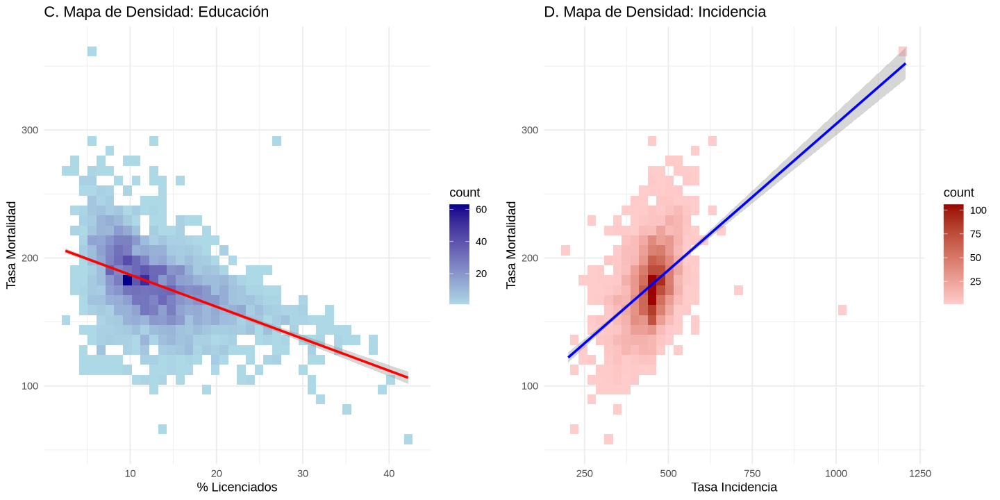

In [36]:
g_dens_edu <- ggplot(data_final, aes(x = pctbachdeg25_over, y = target_deathrate)) +
  stat_bin2d(bins = 40) + # Crea el mapa de calor
  scale_fill_gradient(low = "lightblue", high = "darkblue") +
  geom_smooth(method = "lm", color = "red", lwd = 1) + 
  labs(title = "C. Mapa de Densidad: Educación",
       x = "% Licenciados", y = "Tasa Mortalidad") +
  theme_minimal()

g_dens_inc <- ggplot(data_final, aes(x = incidencerate, y = target_deathrate)) +
  stat_bin2d(bins = 40) +
  scale_fill_gradient(low = "#ffcccc", high = "#990000") +
  geom_smooth(method = "lm", color = "blue", lwd = 1) +
  labs(title = "D. Mapa de Densidad: Incidencia",
       x = "Tasa Incidencia", y = "Tasa Mortalidad") +
  theme_minimal()

grid.arrange(g_dens_edu, g_dens_inc, ncol = 2)

### ¿Qué nos dice este gráfico?

**Gráfico A: Mortalidad por Nivel Educativo (`pctbachdeg25_over`)**
* **Patrón de Escalera:** Vemos claramente cómo las cajas van bajando de izquierda a derecha.
    * **"Muy Baja" Educación (Rojo):** La caja está más arriba (mayor mortalidad).
    * **"Muy Alta" Educación (Azul):** La caja está mucho más abajo (menor mortalidad).
* **Reducción de Riesgo (Tamaño de la caja):** Fíjate que la caja azul ("Muy Alta") es más pequeña y compacta que la roja.
    * **Conclusión clave:** Los condados con alta educación no solo tienen **menos mortalidad en promedio**, sino que también tienen **menos variabilidad** (es decir, es mucho más "seguro" predecir que tendrán buena salud). La educación actúa como un factor estabilizador y protector.

**Gráfico B: Mortalidad por Incidencia (`incidencerate`)**
* **Patrón Ascendente:** Aquí la escalera sube.
    * **"Muy Baja" Incidencia (Amarillo):** Mortalidad más baja.
    * **"Muy Alta" Incidencia (Rojo):** Mortalidad más alta.
* **Solapamiento:** Las cajas se solapan un poco más entre sí que en el gráfico de educación.
    * **Conclusión clave:** Aunque hay una relación directa (más cáncer = más muerte), el nivel educativo parece discriminar (separar) los grupos de riesgo de forma un poco más nítida que la simple tasa de incidencia.

### Resumen para tu informe
> "Los diagramas de cajas segmentados por cuartiles confirman la robustez de las relaciones:
> 1.  **Efecto Protector de la Educación:** Se observa una reducción drástica y progresiva de la mortalidad a medida que aumenta el nivel educativo. Además, los condados con educación 'Muy Alta' presentan menor dispersión, lo que sugiere una mayor equidad en salud en esas zonas.
> 2.  **Efecto de Riesgo de la Incidencia:** Se confirma la tendencia ascendente, donde los condados en el cuartil superior de incidencia presentan sistemáticamente las medianas de mortalidad más altas."

## 2. Desarrollo del mejor modelo

### 1. Generad un modelo de regresión lineal simple para cada una de las variables escogidas